# 3945 – Advanced Machine Learning, Sem A 2024
## Home Assignment 3 – Semi-supervised Learning

In this assignment, you will implement a simple case of co-training, a semi-supervised learning algorithm, to classify a dataset with two views of each sample. You will demonstrate the method and design experiments to test its performance.
You should submit a brief report according to the attached template describing your work and finding. The report should be accompanied with a single ipython notebook (.ipynb) file that includes all the code and outputs.
You are encouraged to use methods and techniques covered in class but are also welcome to use any other relevant method you find suitable for the task if you justify your decision. Make sure to use proper ML and DS methodologies when needed (Data preprocessing, Data splits, etc.).

# Submitted

*   Timor Baruch
*   Hadar Pur

# Installs

In [64]:
!pip install --user -q tabulate

# Imports

In [65]:
import numpy as np
from sklearn.model_selection import train_test_split
import copy
import random
from sklearn.metrics import classification_report

import pandas as pd
# from google.colab import files
import os.path
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy import stats
from scipy.stats import pearsonr
from sklearn.naive_bayes import GaussianNB
from numpy import zeros, ones
from numpy.random import multivariate_normal
from sklearn.utils import shuffle

from matplotlib.animation import FuncAnimation
from functools import partial
from IPython.display import HTML
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation

import warnings
warnings.filterwarnings("ignore")

# Helpers


In [66]:
# For google colab usage
def upload_files():
    """
    Uploads files 'x.csv' and 'y.csv' to the local notebook environment.
    """
    # if not (os.path.exists("X.csv")) or not (os.path.exists("y.csv")):
    #   uploaded = files.upload()
    #   for filename in uploaded.keys():
    #       print(f"{filename} uploaded successfully.")

def read_data(x_file, y_file):
    # Check if files exist
    assert os.path.exists(x_file), f"File '{x_file}' not found."
    assert os.path.exists(y_file), f"File '{y_file}' not found."

    # Read data from CSV files with header in the first row
    x_data = pd.read_csv(x_file, header=0)
    y_data = pd.read_csv(y_file, header=0)

    # Ensure both datasets have 1000 samples
    assert len(x_data) == len(y_data) == 1000, "Datasets must contain 1000 samples each."

    assert x_data.shape[1] >= 10, "There should be at least 10 columns in the data."

    # Split x_data into view 1 and view 2 and convert to NumPy arrays
    view1_data = np.array(x_data.iloc[:, :5])  # first 5 columns
    view2_data = np.array(x_data.iloc[:, 5:])  # remaining columns

    # Ensure the binary label is present in both datasets
    assert 'y' in y_data.columns, "Binary label column not found."

    # Ensure the binary label has two unique values
    assert len(y_data['y'].unique()) == 2, "Binary label must have two unique values."

    return view1_data, view2_data, y_data['y'].values  # Return as NumPy arrays

In [67]:
def check_conditional_independence(view1_features, view2_features, labels):
    num_variables = view1_features.shape[1]

    # Calculate partial correlation between view1_features and view2_features given labels
    partial_correlation = []
    for i in range(num_variables):
        for j in range(num_variables):
            if i != j:
                partial_corr = stats.pearsonr(view1_features[:, i] - np.mean(view1_features[:, i]) - labels,
                                               view2_features[:, j] - np.mean(view2_features[:, j]) - labels)[0]
                partial_correlation.append(partial_corr)

    # Check if any partial correlation is significantly different from zero
    p_values = [stats.ttest_1samp(partial_correlation, 0)[1] for _ in partial_correlation]
    any_significant = any(p < 0.05 for p in p_values)

    return any_significant

def check_conditional_independence2(view1_features, view2_features, labels):
    num_variables = view1_features.shape[1]

    # Calculate partial correlation between view1_features and view2_features given labels
    partial_correlation = []
    for i in range(num_variables):
        for j in range(num_variables):
            if i != j:
                partial_corr = pearsonr(view1_features[:, i] - np.mean(view1_features[:, i]) - labels,
                                         view2_features[:, j] - np.mean(view2_features[:, j]) - labels)[0]
                partial_correlation.append(partial_corr)

    # Check if any partial correlation is significantly different from zero
    p_values = [pearsonr(view1_features[:, i] - np.mean(view1_features[:, i]) - labels,
                          view2_features[:, j] - np.mean(view2_features[:, j]) - labels)[1]
                          for i in range(num_variables) for j in range(num_variables) if i != j]
    any_significant = any(p < 0.05 for p in p_values)

    return any_significant

# Part 1: Dataset generation
Part 1: Dataset generation
1. BONUS – 10 points
Generate a 1000 samples dataset with two views for each sample and a binary label.
* Each view should consist of five variables.
* Ensure that the two sets of variables are conditionally independent given the binary label.

  Alternatively, use the supplied dataset with 1000 samples.
The data is available in the files: X.csv, y.csv

2. Split the dataset to train/validation/test sets.
3. Remove 90% of the labels from the train set.


## Dataset Generation (Bonus - 10 points)

In [68]:
def generate_dataset(n_samples=1000, n_features=5):
    # Create covariance matrices
    covariance1 = np.eye(n_features)
    covariance2 = np.eye(n_features) * 2

    # Create means
    mean1 = zeros(n_features)
    mean2 = ones(n_features) * 0.7  # reduce mean difference

    half_samples = n_samples // 2

    # Create views for class 0 with mean1 and covariance1
    view1_class0 = multivariate_normal(mean1, covariance1, half_samples)
    view2_class0 = multivariate_normal(mean1, covariance1, half_samples)

    # Create views for class 1 with mean2 and covariance2
    view1_class1 = multivariate_normal(mean2, covariance2, half_samples)
    view2_class1 = multivariate_normal(mean2, covariance2, half_samples)

    # Concatenate class 0 and class 1 data
    view1 = np.concatenate([view1_class0, view1_class1])
    view2 = np.concatenate([view2_class0, view2_class1])

    # Create labels (first half samples belong to class 0, second half belong to class 1)
    labels = np.concatenate((np.zeros(half_samples, dtype=int), np.ones(half_samples, dtype=int)))

    # Randomly shuffle data and labels
    view1, view2, labels = shuffle(view1, view2, labels, random_state=0)

    return view1, view2, labels


## Remove labeles & Split dataset methods


In [69]:
def split_dataset(view1_features, view2_features, labels):
    # Split into train, validation, test sets
    v1_train, v1_temp, v2_train, v2_temp, labels_train, labels_temp = train_test_split(
        view1_features, view2_features, labels, test_size=0.3, random_state=42)
    v1_val, v1_test, v2_val, v2_test, labels_val, labels_test = train_test_split(
        v1_temp, v2_temp, labels_temp, test_size=0.5, random_state=42)

    return (v1_train, v2_train, labels_train), (v1_val, v2_val, labels_val), (v1_test, v2_test, labels_test)

In [70]:
def remove_labels(train_labels):
    # Remove 90% of labels
    num_unlabeled = int(0.9 * len(train_labels))
    unlabeled_indices = np.random.choice(len(train_labels), num_unlabeled, replace=False)
    train_labels_copy = np.copy(train_labels)
    train_labels_copy[unlabeled_indices] = -1  # Mark unlabeled samples with -1
    return train_labels_copy

## Prepare dataset

In [71]:
def prepare_dataset(use_generated=True):
    """
    Prepares the dataset either by generating it or using uploaded files.
    """
    if use_generated:
        view1, view2, labels = generate_dataset()
    else:
        upload_files()  # Upload 'X.csv' and 'y.csv' files
        view1, view2, labels = read_data("X.csv", "y.csv")

    # Split dataset
    train_dataset, val_dataset, test_dataset = split_dataset(view1, view2, labels)

    # Remove labels from train set
    train_dataset_labels_removed = (train_dataset[0], train_dataset[1], remove_labels(train_dataset[2]))

    return train_dataset_labels_removed, train_dataset, val_dataset, test_dataset

In [72]:
def prepare_data_for_cotraining(train_dataset_labels_removed, val_dataset, test_dataset):
    """
    Prepare data for training, validation, and testing.
    """
    # Training data
    X1_train = train_dataset_labels_removed[0]
    X2_train = train_dataset_labels_removed[1]
    y_train = train_dataset_labels_removed[2]

    # Validation data
    X1_val = val_dataset[0]
    X2_val = val_dataset[1]
    y_val = val_dataset[2]

    # Testing data
    X1_test = test_dataset[0]
    X2_test = test_dataset[1]
    y_test = test_dataset[2]

    return X1_train, X2_train, y_train, X1_val, X2_val, y_val, X1_test, X2_test, y_test


def prepare_data_for_training_existing_model(train_dataset, val_dataset, test_dataset):
    """
    Prepare data for training, validation, and testing.
    """
    # Training data
    X_train = np.hstack((train_dataset[0], train_dataset[1]))
    y_train = train_dataset[2]

    # Validation data
    X_val = np.hstack((val_dataset[0], val_dataset[1]))
    y_val = val_dataset[2]

    # Testing data
    X_test = np.hstack((test_dataset[0], test_dataset[1]))
    y_test = test_dataset[2]

    return X_train, y_train, X_val, y_val, X_test, y_test


# Part 2: Co-training Implementation
4. Implement co-training Algorithm:
* Initialize two separate models (g1 and g2).
Note: The models should implement predict_proba() that will be used next.
* Iterate through the co-training process:
  * Train the models using the labeled data available.
  * Generate predictions on all the unlabeled data using both models.
  * Add pseudo-labels for unlabeled samples based on model confidence.
    * Get predicted probabilities for the unlabeled samples.
    * Select a predefined number of unlabeled samples to be added to the labeled data.
    These samples should have high confidence (predicted probability) in one of the models.
    * Add the selected samples to the labeled data with the predicted high confidence
    * Remove the selected samples from the unlabeled data.
  * Retrain models g1 and g2 using all labeled data (original + new).
  * Repeat until all samples are added to the label (or another stopping criteria)
5. Run the co-training algorithm on the generated dataset.
6. Report the results.
7. Compare the results to a model trained using a fully labeled train data.

In [73]:
class CoTrainingClassifier(object):
    """
    Parameters:
    model1 - The first classifier to be used in the co-training algorithm.
    model2 - The second classifier to be used in the co-training algorithm.
    num_iterations - (Optional) The number of iterations. Default is 100.
    pool_size - (Optional) The size of the pool of unlabeled samples. Default is 70.
    confidence_level - The confidence level for label assignment. Default is 0.65 (65% of confidence).
    top_k - Determines how many of the highest probability samples are chosen for labeling in each iteration of the co-training loop. Default is 4.
    """

    def __init__(self, model1, model2, num_iterations=100, pool_size=70, confidence_level=0.65, top_k=4):
        self.model1_ = model1
        self.model2_ = model2
        self.num_iterations_ = num_iterations
        self.pool_size_ = pool_size
        self.confidence_level_ = confidence_level
        self.top_k_ = top_k
        random.seed(42)


    def fit(self, X1, X2, y_train, X1_val, X2_val, y_val, logger=True):
        """
        Description:
        Fits the classifiers on the partially labeled data y.

        Parameters:
        X1 - array-like (n_samples, n_features_1): First set of features for samples.
        X2 - array-like (n_samples, n_features_2): Second set of features for samples.
        y - array-like (n_samples): Labels for samples, -1 indicates unlabeled.
        X1_val - array-like (n_validation_samples, n_features_1): Validation set for features from X1.
        X2_val - array-like (n_validation_samples, n_features_2): Validation set for features from X2.
        y_val - array-like (n_validation_samples): Labels for the validation samples.
        """

        y = np.asarray(y_train)

        # Initialize the set of unlabeled samples
        unlabeled_idx = [i for i, y_i in enumerate(y) if y_i == -1]
        random.shuffle(unlabeled_idx)

        # Selects a subset of unlabeled samples to form the initial pool of unlabeled samples
        pool_unlabeled = unlabeled_idx[-min(len(unlabeled_idx), self.pool_size_):]
        self.pool_size_ = min(len(unlabeled_idx), self.pool_size_)

        # Initialize the set of labeled samples
        labeled_idx = [i for i, y_i in enumerate(y) if y_i != -1]

        # Updates the unlabeled_idx list by removing the indices that were included in the pool_unlabeled
        unlabeled_idx = unlabeled_idx[:-len(pool_unlabeled)]

        it = 0  # Number of co-training iterations
        scores = []

        # Loop until we have assigned labels to all unlabeled samples or we reached max iterations
        while it != self.num_iterations_ and unlabeled_idx:
            it += 1

            # Train the models using the labeled data
            self.model1_.fit(X1[labeled_idx], y[labeled_idx])
            self.model2_.fit(X2[labeled_idx], y[labeled_idx])

            # Generate predictions on all the unlabeled data using both models
            y1_probs = self.model1_.predict_proba(X1[pool_unlabeled])
            y2_probs = self.model2_.predict_proba(X2[pool_unlabeled])

            pos_label_indices = set()
            neg_label_indices = set()

            # Iterate over the top top_k indices sorted by probability for the negative class of y1_probs
            for i in (y1_probs[:, 0].argsort())[-self.top_k_:]:
                # Check if the probability of the negative class is greater than self.confidence_level_
                if y1_probs[i, 0] > self.confidence_level_:
                    # Append the index to neg_label_indices list
                    neg_label_indices.add(i)

            # Iterate over the top top_k_ indices sorted by probability for the positive class of y1_probs
            for i in (y1_probs[:, 1].argsort())[-self.top_k_:]:
                # Check if the probability of the positive class is greater than self.confidence_level_
                if y1_probs[i, 1] > self.confidence_level_:
                    # Append the index to pos_label_indices list
                    pos_label_indices.add(i)

            # Pre processinh the y2_probs array for not including already pseudo labeled samples from model1
            y2_probs_temp_1 = np.asarray([y2_probs[i, 0] for i in np.arange(len(y2_probs[:, 0])) if y2_probs[i, 0] not in neg_label_indices])
            # Iterate over the top_k_ indices sorted by probability for the negative class of y2_probs
            for i in y2_probs_temp_1.argsort()[-self.top_k_:]:
                # Check if the probability of the negative class is greater than self.confidence_level_
                if y2_probs_temp_1[i] > self.confidence_level_:
                    # Append the index to neg_label_indices list
                    neg_label_indices.add(i)

            # Pre processinh the y2_probs array for not including already pseudo labeled samples from model1
            y2_probs_temp_2 = np.asarray([y2_probs[i, 1] for i in np.arange(len(y2_probs[:, 1])) if y2_probs[i, 1] not in pos_label_indices])
            # Iterate over the top_k_ indices sorted by probability for the positive class of y2_probs
            for i in y2_probs_temp_2.argsort()[-self.top_k_:]:
                # Check if the probability of the positive class is greater than self.confidence_level_
                if y2_probs_temp_2[i] > self.confidence_level_:
                    # Append the index to pos_label_indices list
                    pos_label_indices.add(i)

            # Update labels based on predictions
            y[[pool_unlabeled[x] for x in pos_label_indices]] = 1
            y[[pool_unlabeled[x] for x in neg_label_indices]] = 0

            # Extend the labeled index list with the indices of newly labeled samples
            labeled_idx.extend([pool_unlabeled[x] for x in pos_label_indices])
            labeled_idx.extend([pool_unlabeled[x] for x in neg_label_indices])

            # Remove the newly labeled samples from the pool of unlabeled samples (the indices in the pos and neg labeled list match the indices in pool unlabeled)
            pool_unlabeled = [elem for elem in pool_unlabeled if not (elem in [pool_unlabeled[x] for x in pos_label_indices] or elem in [pool_unlabeled[x] for x in neg_label_indices])]

            # Add newly labeled samples from unlabeled set to the pool of unlabeled samples
            add_counter = 0  # Number we have added from unlabeled_idx to pool_unlabeled

            # Calculate the number of samples to add to the unlabeld pool' should be equal to the amount we extract from the pool
            num_to_add = len(pos_label_indices) + len(neg_label_indices)

            # Add to the unlabeled pool just the delta between the current size of the pool after pseudo labeleing and the pool size param
            if (len(pool_unlabeled) + num_to_add > self.pool_size_):
                num_to_add = self.pool_size_ - len(pool_unlabeled)

            while add_counter != num_to_add and unlabeled_idx:
                add_counter += 1
                # Add a sample from the unlabeled set to the unlabeled pool
                pool_unlabeled.append(unlabeled_idx.pop())

            # Print predictions and accuracy on validation set
            val_pred = self.predict(X1_val, X2_val)
            val_accuracy = accuracy_score(y_val, val_pred)
            val_fscore = f1_score(y_val, val_pred)
            val_precision = precision_score(y_val, val_pred)
            val_recall = recall_score(y_val, val_pred)

            # Update fit data to track progress
            scores.append({
                'Accuracy': val_accuracy,
                'f1 Score': val_fscore,
                'Precision': val_precision,
                'Recall': val_recall
            })

            if logger:
              print(f"Iteration {it}: \nValidation Accuracy: {val_accuracy}\nF1 Score: {val_fscore}\nPrecision: {val_precision}\nRecall: {val_recall}\n\n")

        # Fit final models
        self.model1_.fit(X1[labeled_idx], y[labeled_idx])
        self.model2_.fit(X2[labeled_idx], y[labeled_idx])

        return scores, y


    def predict(self, X1, X2):
        """
        Predict the classes of the samples represented by the features in X1 and X2.

        Parameters:
        X1 - array-like (n_samples, n_features1): Features for samples from first view.
        X2 - array-like (n_samples, n_features2): Features for samples from second view.

        Output:
        y - array-like (n_samples): Predicted classes of each of the samples.
        """

        # Predict labels using the models
        y1 = self.model1_.predict(X1)
        y2 = self.model2_.predict(X2)

        y_preds = np.asarray([-1] * X1.shape[0]) # Initialize predictions

        for i, (y1_i, y2_i) in enumerate(zip(y1, y2)):
            if y1_i == y2_i:
                # If both models agree, choose their prediction
                y_preds[i] = y1_i
            else:
                # Choose the label from the model with higher confidence
                y1_probs = self.model1_.predict_proba([X1[i]])[0]
                y2_probs = self.model2_.predict_proba([X2[i]])[0]
                if max(y1_probs) > max(y2_probs):
                    y_preds[i] = y1_i
                elif max(y2_probs) > max(y1_probs):
                    y_preds[i] = y2_i
                else:
                    #the classifiers disagree and their confidence is the same, so we guess the value
                    y_preds[i] = random.randint(0, 1)

        return y_preds


    def predict_proba(self, X1, X2):
        """
        Predict the probability of the samples belonging to each class.

        Parameters:
        X1 - array-like (n_samples, n_features1): Features for samples from first view.
        X2 - array-like (n_samples, n_features2): Features for samples from second view.

        Output:
        y_proba - array-like (n_samples, 2): Predicted probability of each class for each sample.
        """

        y_proba = np.full((X1.shape[0], 2), -1, dtype=np.float32) # Initialize array to store probabilities

        # Predict probabilities using the classifiers
        y1_proba = self.model1_.predict_proba(X1)
        y2_proba = self.model2_.predict_proba(X2)

        # Calculate the average probabilities from both classifiers
        for i, (y1_i_dist, y2_i_dist) in enumerate(zip(y1_proba, y2_proba)):
            y_proba[i][0] = (y1_i_dist[0] + y2_i_dist[0]) / 2
            y_proba[i][1] = (y1_i_dist[1] + y2_i_dist[1]) / 2

        return y_proba



# Part 3 (Bonus – 10 points): Visualization
13. Generate a visualization demonstrating the co-training process.

In [74]:
def scatter_plot_features(pca_result, labels, view_name):
    sns.set(style="darkgrid")

    plt.figure(figsize=(8, 6))

    unique_labels = [0, 1]  # Specify the labels you want to include
    palette = sns.color_palette("husl", len(unique_labels))
    label_color_dict = {label: color for label, color in zip(unique_labels, palette)}

    for label in unique_labels:
        subset_indices = labels == label
        sns.scatterplot(x=pca_result[subset_indices, 0], y=pca_result[subset_indices, 1], hue=labels[subset_indices].astype(int), palette=label_color_dict)

    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title('Scatter Plot of {} Features (PCA)'.format(view_name))
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1, 1), loc='upper right')
    plt.show()



In [75]:
def plot_co_training_performance(metrics_list, n_iterations):
    sns.set(style="darkgrid")

    plt.figure(figsize=(10, 6))

    # Plot each metric
    for metric_name in metrics_list[0].keys():
        sns.lineplot(x=range(1, n_iterations + 1), y=[metrics[metric_name] for metrics in metrics_list], label=metric_name)

    plt.xlabel('Iteration', fontsize=12)
    plt.ylabel('Score', fontsize=12)

    plt.title('Co-Training Classifier Performance', fontsize=14)
    plt.legend(fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1, 1), loc='upper right')
    plt.xlim(0)
    plt.tight_layout()
    plt.show()

In [76]:
def plot_decision_boundaries_with_dr(ax1, x1, x2, y, clf, resolution=0.1, title=None):
    # Perform PCA for dimensionality reduction to 2D for each view separately
    pca1 = PCA(n_components=2, random_state=42)
    X1_pca = pca1.fit_transform(x1)

    pca2 = PCA(n_components=2, random_state=42)
    X2_pca = pca2.fit_transform(x2)

    # Plot the decision surface for each view separately
    axis_max = abs(X1_pca).max().round() + 1

    xx1, yy1 = np.meshgrid(np.arange(-axis_max, axis_max, resolution),
                           np.arange(-axis_max, axis_max, resolution))
    xx2, yy2 = np.meshgrid(np.arange(-axis_max, axis_max, resolution),
                           np.arange(-axis_max, axis_max, resolution))

    meshgrid_original1 = np.c_[xx1.ravel(), yy1.ravel()]
    meshgrid_original2 = np.c_[xx2.ravel(), yy2.ravel()]

    meshgrid_transformed1 = pca1.inverse_transform(meshgrid_original1)
    meshgrid_transformed2 = pca2.inverse_transform(meshgrid_original2)

    # Predict using the CoTrainingClassifier
    Z = clf.predict(meshgrid_transformed1, meshgrid_transformed2)
    Z1 = Z.reshape(xx1.shape)

    ax1.contourf(xx1, yy1, Z1.reshape(xx1.shape), alpha=0.3)

    # Plot class samples for each view separately
    scatter1 = ax1.scatter(X1_pca[:, 0], X1_pca[:, 1], c=y, s=25, edgecolors='k')

    # Add legend for classes
    legend1 = ax1.legend(*scatter1.legend_elements(), title="Classes",  loc="upper right")

    ax1.add_artist(legend1)

    # Set axis limits and labels for each view
    ax1.set_xlim(-axis_max, axis_max)
    ax1.set_ylim(-axis_max, axis_max)
    ax1.set_xlabel('Principal Component 1')
    ax1.set_ylabel('Principal Component 2')
    ax1.set_title(f'{title}')

    return ax1


In [77]:
def compare_models(train_dataset_labels_removed, train_dataset, val_dataset, test_dataset, clf1, clf2):
    X1, X2, y_train, X1_val, X2_val, y_val, X1_test, X2_test, y_test = prepare_data_for_cotraining(train_dataset_labels_removed, val_dataset, test_dataset)

    # Initialize CoTrainingClassifier
    cotraining_clf = CoTrainingClassifier(clf1, clf2)
    # Fit CoTrainingClassifier
    acc_cotrain = cotraining_clf.fit(X1.copy(), X2.copy(), y_train.copy(), X1_val.copy(), X2_val.copy(), y_val.copy())
    # Predict labels for test data using CoTrainingClassifier
    y_pred_cotraining = cotraining_clf.predict(X1_test.copy(), X2_test.copy())

    # Train the first classifier using fully labeled data
    X_train, y_train, X_val, y_val, X_test, y_test = prepare_data_for_training_existing_model(train_dataset, val_dataset, test_dataset)

    fully_labeled_clf_1 = clf1
    acc_train_fully_1 = fully_labeled_clf_1.fit(X_train.copy(), y_train.copy())
    # Predict labels for test data using fully labeled model
    y_pred_full_1 = fully_labeled_clf_1.predict(X_test.copy())

    # Train the second classifier using fully labeled data
    fully_labeled_clf_2 = clf2
    acc_train_fully_2 = fully_labeled_clf_2.fit(X_train.copy(), y_train.copy())
    # Predict labels for test data using fully labeled model
    y_pred_full_2 = fully_labeled_clf_2.predict(X_test.copy())

    y_preds = y_pred_cotraining, y_pred_full_1, y_pred_full_2
    metrics_dict = evaluate_models(y_test, y_preds, cotraining_clf, fully_labeled_clf_1, fully_labeled_clf_2)

    print(f"\nAccuracy of {cotraining_clf.__class__.__name__}: {metrics_dict[cotraining_clf.__class__.__name__][0] * 100:.2f}%")
    print(f"Precision of {cotraining_clf.__class__.__name__}: {metrics_dict[cotraining_clf.__class__.__name__][1] * 100:.2f}%")
    print(f"Recall of {cotraining_clf.__class__.__name__}: {metrics_dict[cotraining_clf.__class__.__name__][2] * 100:.2f}%")
    print(f"F1 score of {cotraining_clf.__class__.__name__}: {metrics_dict[cotraining_clf.__class__.__name__][3] * 100:.2f}%\n")

    print(f"Accuracy of {fully_labeled_clf_1.__class__.__name__}: {metrics_dict[fully_labeled_clf_1.__class__.__name__][0] * 100:.2f}%")
    print(f"Precision of {fully_labeled_clf_1.__class__.__name__}: {metrics_dict[fully_labeled_clf_1.__class__.__name__][1] * 100:.2f}%")
    print(f"Recall of {fully_labeled_clf_1.__class__.__name__}: {metrics_dict[fully_labeled_clf_1.__class__.__name__][2] * 100:.2f}%")
    print(f"F1 score of {fully_labeled_clf_1.__class__.__name__}: {metrics_dict[fully_labeled_clf_1.__class__.__name__][3] * 100:.2f}%\n")

    print(f"Accuracy of {fully_labeled_clf_2.__class__.__name__}: {metrics_dict[fully_labeled_clf_2.__class__.__name__][0] * 100:.2f}%")
    print(f"Precision of {fully_labeled_clf_2.__class__.__name__}: {metrics_dict[fully_labeled_clf_2.__class__.__name__][1] * 100:.2f}%")
    print(f"Recall of {fully_labeled_clf_2.__class__.__name__}: {metrics_dict[fully_labeled_clf_2.__class__.__name__][2] * 100:.2f}%")
    print(f"F1 score of {fully_labeled_clf_2.__class__.__name__}: {metrics_dict[fully_labeled_clf_2.__class__.__name__][3] * 100:.2f}%\n")

    return metrics_dict

def predict_models(X1_test, X2_test, X_test, cotraining_clf, fully_labeled_clf_1, fully_labeled_clf_2):
    y_pred_cotraining = cotraining_clf.predict(X1_test.copy(), X2_test.copy())
    y_pred_full_1 = fully_labeled_clf_1.predict(X_test.copy())
    y_pred_full_2 = fully_labeled_clf_2.predict(X_test.copy())

    return y_pred_cotraining, y_pred_full_1, y_pred_full_2

def evaluate_models(y_true, y_preds, cotraining_clf, fully_labeled_clf_1, fully_labeled_clf_2):
    accuracy_cotraining = accuracy_score(y_true, y_preds[0])
    accuracy_full_1 = accuracy_score(y_true, y_preds[1])
    accuracy_full_2 = accuracy_score(y_true, y_preds[2])

    precision_cotraining = precision_score(y_true, y_preds[0])
    precision_full_1 = precision_score(y_true, y_preds[1])
    precision_full_2 = precision_score(y_true, y_preds[2])

    recall_cotraining = recall_score(y_true, y_preds[0])
    recall_full_1 = recall_score(y_true, y_preds[1])
    recall_full_2 = recall_score(y_true, y_preds[2])

    fscore_cotraining = f1_score(y_true, y_preds[0])
    fscore_full_1 = f1_score(y_true, y_preds[1])
    fscore_full_2 = f1_score(y_true, y_preds[2])

    metrics_dict = {
        cotraining_clf.__class__.__name__: [accuracy_cotraining, precision_cotraining, recall_cotraining, fscore_cotraining],
        fully_labeled_clf_1.__class__.__name__: [accuracy_full_1, precision_full_1, recall_full_1, fscore_full_1],
        fully_labeled_clf_2.__class__.__name__: [accuracy_full_2, precision_full_2, recall_full_2, fscore_full_2]
    }

    return metrics_dict

In [78]:
def plot_model_comparison(models, metrics_dict, bar_width=0.4):
    """
    Plot comparison of model performance for given metrics.
    """

    # Create DataFrame for Seaborn
    data = {'Model': [], 'Metric': [], 'Value': []}
    for model, metrics in metrics_dict.items():
        for i, metric in enumerate(['Accuracy', 'Precision', 'Recall', 'F1 Score']):
            data['Model'].append(model)
            data['Metric'].append(metric)
            data['Value'].append(metrics[i])
    df = pd.DataFrame(data)

    # Plot using Seaborn
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Model', y='Value', hue='Metric', data=df, palette='Set3', ci=None, dodge=True)

    # Add value annotations on top of each bar
    for patch in plt.gca().patches:
        height = patch.get_height()
        plt.gca().annotate(f'{height:.2f}', (patch.get_x() + patch.get_width() / 2, height),
                           ha='center', va='bottom', fontsize=9)

    plt.xlabel('Models')
    plt.ylabel('Metrics')
    plt.title('Comparison of Model Performance')
    plt.legend(title='Metrics', loc='lower right')
    plt.tight_layout()
    plt.show()

# Generated Dataset

## Dataset

In [79]:
train_dataset_labels_removed, train_dataset, val_dataset, test_dataset = prepare_dataset(use_generated=True)

In [80]:
# Check shapes
datasets = ['Train Dataset', 'Validation Dataset', 'Test Dataset', 'Train Dataset (90% of Labels Removed)']

for i, dataset in enumerate((train_dataset, val_dataset, test_dataset, train_dataset_labels_removed)):
    print(f"{datasets[i]} - View 1 Shape: {dataset[0].shape}, View 2 Shape: {dataset[1].shape}, Labels Shape: {dataset[2].shape}\n")

Train Dataset - View 1 Shape: (700, 5), View 2 Shape: (700, 5), Labels Shape: (700,)

Validation Dataset - View 1 Shape: (150, 5), View 2 Shape: (150, 5), Labels Shape: (150,)

Test Dataset - View 1 Shape: (150, 5), View 2 Shape: (150, 5), Labels Shape: (150,)

Train Dataset (90% of Labels Removed) - View 1 Shape: (700, 5), View 2 Shape: (700, 5), Labels Shape: (700,)



In [81]:
X1, X2, y_train, X1_val, X2_val, y_val, X1_test, X2_test, y_test = prepare_data_for_cotraining(train_dataset_labels_removed, val_dataset, test_dataset)

In [82]:
data = {'X1': [len(X1)],
        'X2': [len(X2)],
        'y_train': [len(y_train)],
        'X1_val': [len(X1_val)],
        'X2_val': [len(X2_val)],
        'y_val': [len(y_val)],
        'X1_test': [len(y_test)],
        'X2_test': [len(y_test)],
        'y_test': [len(y_test)]}

df = pd.DataFrame(data, index=["Dataset"])

print(df.to_markdown())

|         |   X1 |   X2 |   y_train |   X1_val |   X2_val |   y_val |   X1_test |   X2_test |   y_test |
|:--------|-----:|-----:|----------:|---------:|---------:|--------:|----------:|----------:|---------:|
| Dataset |  700 |  700 |       700 |      150 |      150 |     150 |       150 |       150 |      150 |


In [83]:
result = check_conditional_independence(X1, X2, y_train)
print(f"The generated dataset stands in conditional independence test 1? - {result}")

The generated dataset stands in conditional independence test 1? - True


In [84]:
result = check_conditional_independence2(X1, X2, y_train)
print(f"The generated dataset stands in conditional independence test 2? - {result}")

The generated dataset stands in conditional independence test 2? - True


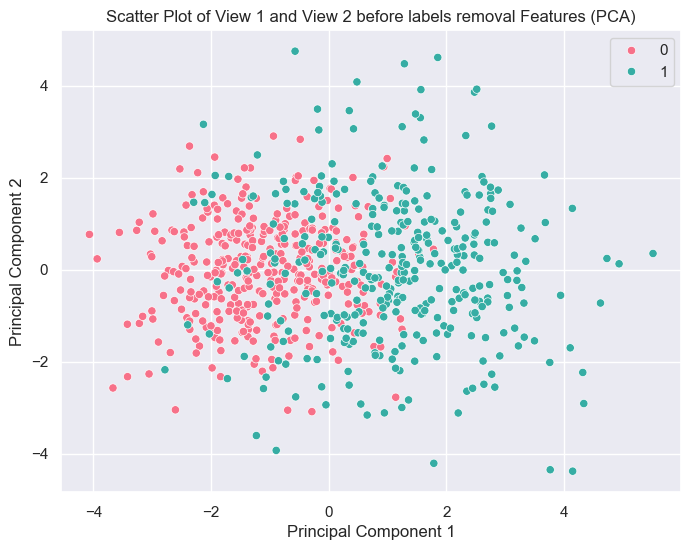

In [85]:
pca = PCA(n_components=2)  # Use PCA to reduce dimensionality to 2 components
pca_result = pca.fit_transform(np.hstack((train_dataset[0], train_dataset[1])))

scatter_plot_features(pca_result, train_dataset[2], "View 1 and View 2 before labels removal")

In [86]:
pca = PCA(n_components=2)  # Use PCA to reduce dimensionality to 2 components
pca_result_x1 = pca.fit_transform(X1)
pca_result_x2 = pca.fit_transform(X2)

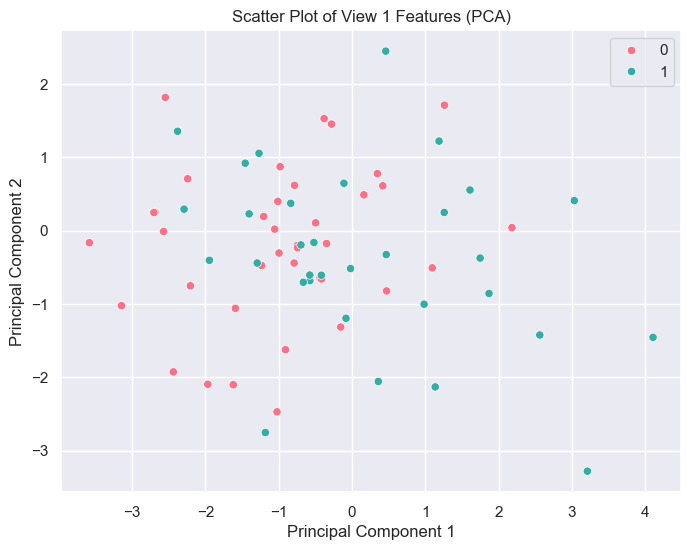

In [87]:
scatter_plot_features(pca_result_x1, y_train, "View 1")

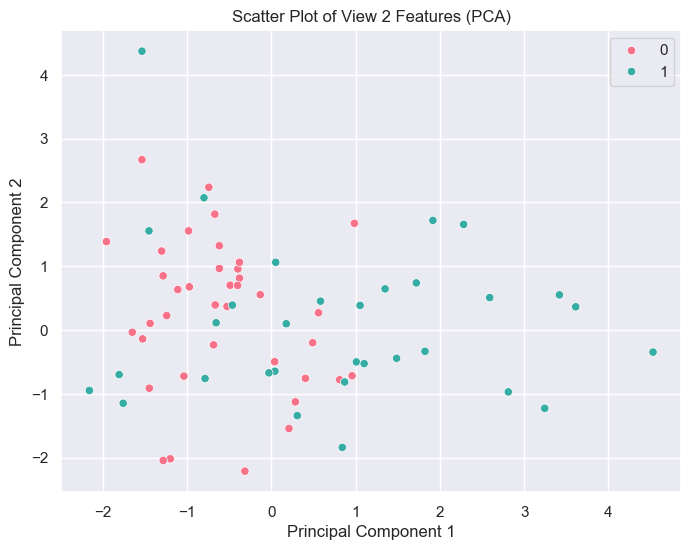

In [88]:
scatter_plot_features(pca_result_x2, y_train, "View 2")

In [89]:
print(y_train)

[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1  0 -1 -1 -1 -1 -1  1  0  1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1
  0  0  1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1  0 -1 -1 -1 -1 -1
 -1 -1 -1  0 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1
  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1  0 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1
 -1 -1 -1 -1  1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1

## CoTraining

In [90]:
lg_clf = CoTrainingClassifier(GaussianNB(), GaussianNB())
val_scores, y_after_train = lg_clf.fit(X1.copy(), X2.copy(), y_train.copy(), X1_val.copy(), X2_val.copy(), y_val.copy())
y_pred = lg_clf.predict(X1_test.copy(), X2_test.copy())

Iteration 1: 
Validation Accuracy: 0.8266666666666667
F1 Score: 0.8470588235294118
Precision: 0.8888888888888888
Recall: 0.8089887640449438


Iteration 2: 
Validation Accuracy: 0.8466666666666667
F1 Score: 0.863905325443787
Precision: 0.9125
Recall: 0.8202247191011236


Iteration 3: 
Validation Accuracy: 0.8533333333333334
F1 Score: 0.8690476190476191
Precision: 0.9240506329113924
Recall: 0.8202247191011236


Iteration 4: 
Validation Accuracy: 0.86
F1 Score: 0.8757396449704142
Precision: 0.925
Recall: 0.8314606741573034


Iteration 5: 
Validation Accuracy: 0.8466666666666667
F1 Score: 0.8654970760233918
Precision: 0.9024390243902439
Recall: 0.8314606741573034


Iteration 6: 
Validation Accuracy: 0.86
F1 Score: 0.8771929824561403
Precision: 0.9146341463414634
Recall: 0.8426966292134831


Iteration 7: 
Validation Accuracy: 0.86
F1 Score: 0.8757396449704142
Precision: 0.925
Recall: 0.8314606741573034


Iteration 8: 
Validation Accuracy: 0.8533333333333334
F1 Score: 0.8690476190476191
Prec

In [91]:
# Count occurrences of unlabeled samples after train
count = np.count_nonzero(y_after_train == -1)

print("Number of unlabeled samples after training:", count)

Number of unlabeled samples after training: 63


In [92]:
y_after_train

array([ 1,  1,  0, -1,  1,  1,  0,  0,  1,  0,  1,  1,  1,  0,  0,  1,  0,
        0,  0,  1,  1,  0,  0,  1,  0, -1,  0,  0,  0,  1,  1,  0,  1,  0,
        1,  0,  0,  1,  1,  0,  0,  1,  0,  1,  0, -1,  0,  0,  0,  0,  1,
        1,  0,  1,  0,  1,  0,  0,  0,  0,  1, -1,  0,  0,  1,  1,  0,  0,
        0,  1,  0,  1,  0,  1,  0,  1,  0,  0,  1,  0,  1,  0,  1,  0,  1,
       -1,  1,  1,  1, -1,  1,  1,  0,  1,  0,  1, -1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  0,  0,  0,  1,  0,  0,  1, -1,  0,  0,  1,  1,  1,
        0,  0,  0,  0,  0,  1,  0,  1,  1,  1,  0,  1,  0,  1,  1,  0,  1,
        0, -1,  0,  0,  0,  0,  1,  1,  0,  1,  1,  0,  0,  0,  1,  1,  1,
        1,  0, -1,  0,  1, -1,  1,  1,  1,  0,  0, -1, -1,  0,  0,  0,  0,
        1,  0,  1,  1,  1,  1,  1,  0,  1,  1,  0,  1,  0,  0,  0,  1,  1,
        1,  1,  0,  1,  1,  1,  1,  1,  0, -1,  0,  0,  0,  1, -1,  0,  0,
        1,  1,  0,  0,  1,  1,  0,  1,  0,  0,  0, -1,  1, -1,  1,  0,  0,
       -1,  0,  1,  0,  0

In [93]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91        76
           1       0.95      0.85      0.90        74

    accuracy                           0.91       150
   macro avg       0.91      0.91      0.91       150
weighted avg       0.91      0.91      0.91       150



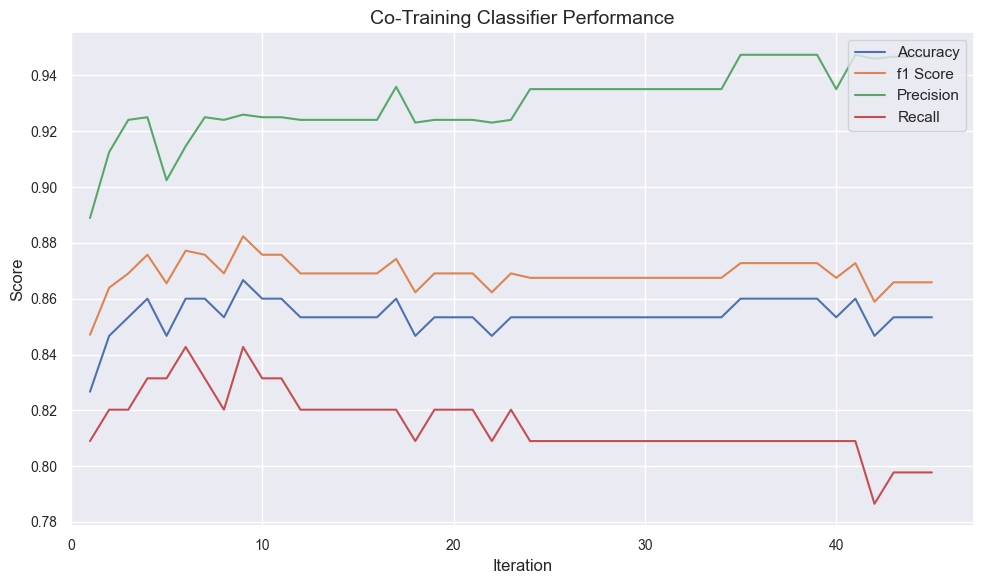

In [94]:
# val_scores
plot_co_training_performance(val_scores, len(val_scores))

## Decision Bounderies & Animation

Updating frame 1
Updating frame 4
Updating frame 7
Updating frame 10
Updating frame 13
Updating frame 16
Updating frame 19
Updating frame 22
Updating frame 25
Updating frame 28
Updating frame 31
Updating frame 34
Updating frame 37
Updating frame 40
Updating frame 43
Updating frame 46
Updating frame 49


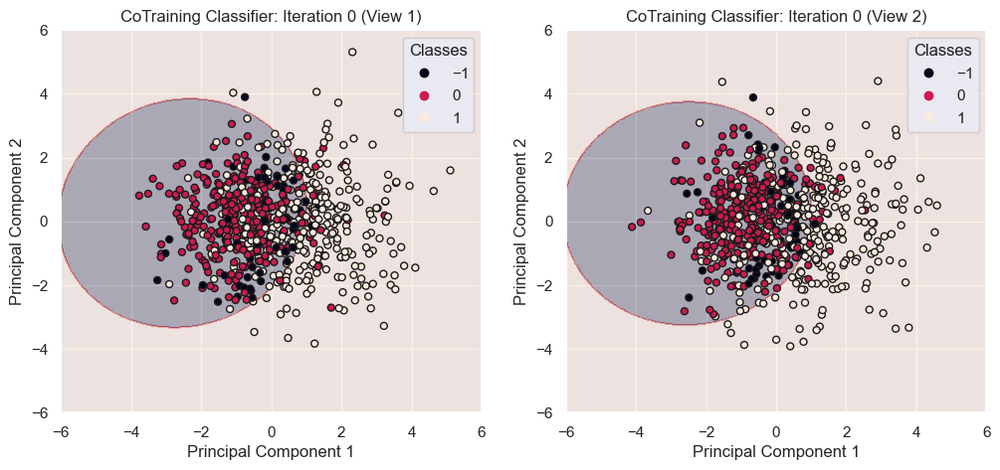

In [95]:
# Function to update the figure which will be used for the animation
def update(num, ax1, ax2, x1, x2, y, x1_val, x2_val, y_val, clf):
    if num%3==1:
      print(f'Updating frame {num}')

    ax1.clear()
    _, y = clf.fit(x1.copy(), x2.copy(), y, x1_val.copy(), x2_val.copy(), y_val.copy(), logger=False)
    plot_decision_boundaries_with_dr(ax1, x1, x2, y, clf, resolution=0.03, title=f"CoTraining Classifier: Iteration {num} (View 1)")

    # Swap models to present view 2
    temp = lg_clf.model1_
    lg_clf.model1_ = lg_clf.model2_
    lg_clf.model2_ = temp

    ax2.clear()
    plot_decision_boundaries_with_dr(ax2, x2, x1, y, clf, resolution=0.03, title=f"CoTraining Classifier: Iteration {num} (View 2)")

    # Revert swap
    temp = lg_clf.model1_
    lg_clf.model1_ = lg_clf.model2_
    lg_clf.model2_ = temp

    return y

# Create subplots for each view
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))

y = y_train.copy()

# Start the co-training generator
lg_clf_anim = CoTrainingClassifier(GaussianNB(), GaussianNB(), num_iterations=1)
# Create a partial function with the parameters for 'update'
partial_update = partial(update, ax1=ax1, ax2=ax2, x1=X1, x2=X2, y=y, x1_val=X1_val, x2_val=X2_val, y_val=y_val, clf=lg_clf_anim)

# Create an animation
ani = FuncAnimation(fig, partial_update, frames=range(0, 50), repeat=False, interval=200)

HTML(ani.to_jshtml())

## Compare to dataset with all labels

In [96]:
clf1 = GaussianNB()
clf2 = GaussianNB()

metrics_dict = compare_models(train_dataset_labels_removed, train_dataset, val_dataset, test_dataset, clf1, clf2)

Iteration 1: 
Validation Accuracy: 0.8266666666666667
F1 Score: 0.8470588235294118
Precision: 0.8888888888888888
Recall: 0.8089887640449438


Iteration 2: 
Validation Accuracy: 0.8466666666666667
F1 Score: 0.863905325443787
Precision: 0.9125
Recall: 0.8202247191011236


Iteration 3: 
Validation Accuracy: 0.8533333333333334
F1 Score: 0.8690476190476191
Precision: 0.9240506329113924
Recall: 0.8202247191011236


Iteration 4: 
Validation Accuracy: 0.86
F1 Score: 0.8757396449704142
Precision: 0.925
Recall: 0.8314606741573034


Iteration 5: 
Validation Accuracy: 0.8466666666666667
F1 Score: 0.8654970760233918
Precision: 0.9024390243902439
Recall: 0.8314606741573034


Iteration 6: 
Validation Accuracy: 0.86
F1 Score: 0.8771929824561403
Precision: 0.9146341463414634
Recall: 0.8426966292134831


Iteration 7: 
Validation Accuracy: 0.86
F1 Score: 0.8757396449704142
Precision: 0.925
Recall: 0.8314606741573034


Iteration 8: 
Validation Accuracy: 0.8533333333333334
F1 Score: 0.8690476190476191
Prec

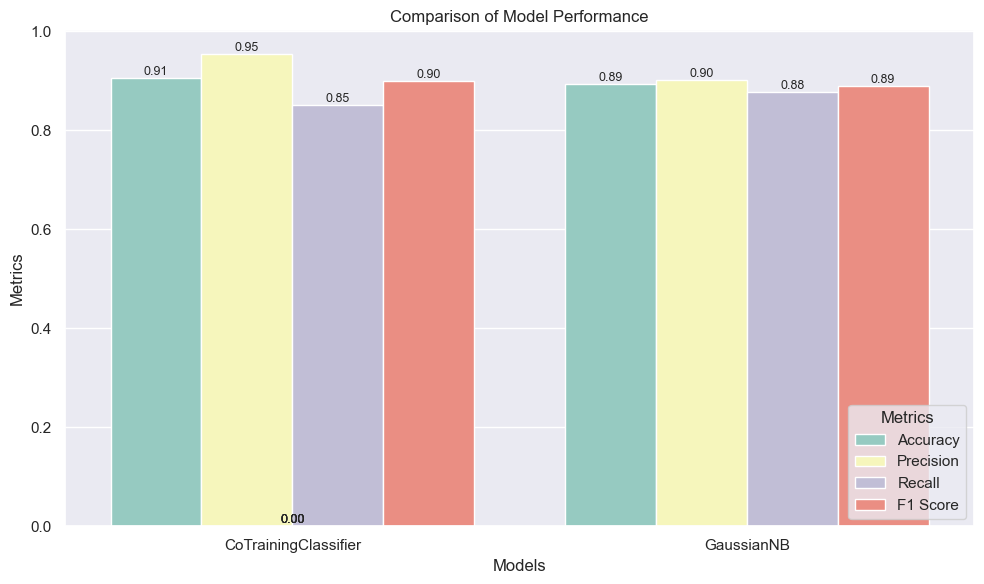

In [97]:
plot_model_comparison(models=metrics_dict.keys(), metrics_dict=metrics_dict)

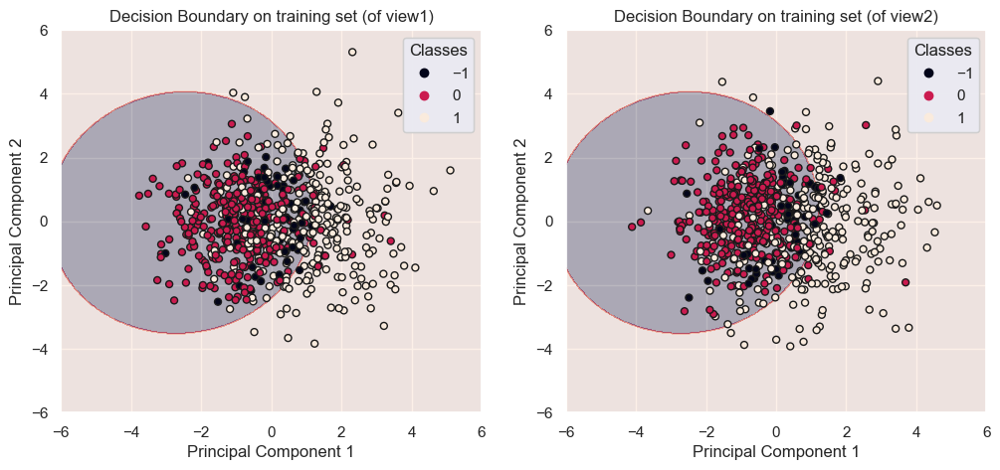

In [98]:
# Create subplots for each view
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot decision boundary for View 1
plot_decision_boundaries_with_dr(ax1, X1, X2, y_after_train, lg_clf, title='Decision Boundary on training set (of view1)', resolution=0.03)

# Swap models to present view 2
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp

# Plot decision boundary for View 2
plot_decision_boundaries_with_dr(ax2, X2, X1, y_after_train, lg_clf, title='Decision Boundary on training set (of view2)', resolution=0.03)
plt.show()

# Revert swap
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp

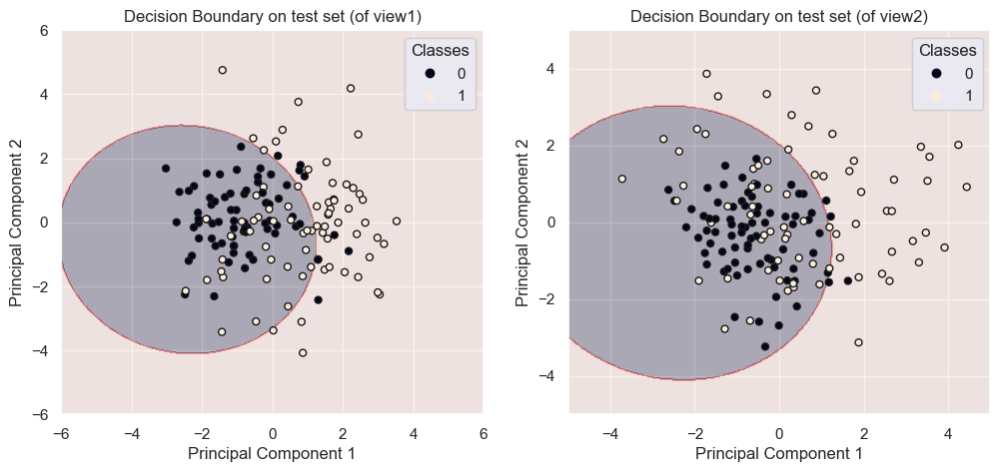

In [99]:
# Create subplots for each view
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot decision boundary for View 1
plot_decision_boundaries_with_dr(ax1, X1_test, X2_test, y_test, lg_clf, title='Decision Boundary on test set (of view1)', resolution=0.03)

# Swap models to present view 2
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp

# Plot decision boundary for View 2
plot_decision_boundaries_with_dr(ax2, X2_test, X1_test, y_test, lg_clf, title='Decision Boundary on test set (of view2)', resolution=0.03)
plt.show()

# Revert swap
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp

# Supplied Dataset

## Dataset

In [117]:
train_dataset_labels_removed, train_dataset, val_dataset, test_dataset = prepare_dataset(use_generated=False)

In [118]:
# Check shapes
datasets = ['Train Dataset', 'Validation Dataset', 'Test Dataset', 'Train Dataset (90% of Labels Removed)']

for i, dataset in enumerate((train_dataset, val_dataset, test_dataset, train_dataset_labels_removed)):
    print(f"{datasets[i]} - View 1 Shape: {dataset[0].shape}, View 2 Shape: {dataset[1].shape}, Labels Shape: {dataset[2].shape}\n")

Train Dataset - View 1 Shape: (700, 5), View 2 Shape: (700, 5), Labels Shape: (700,)

Validation Dataset - View 1 Shape: (150, 5), View 2 Shape: (150, 5), Labels Shape: (150,)

Test Dataset - View 1 Shape: (150, 5), View 2 Shape: (150, 5), Labels Shape: (150,)

Train Dataset (90% of Labels Removed) - View 1 Shape: (700, 5), View 2 Shape: (700, 5), Labels Shape: (700,)



In [119]:
X1, X2, y_train, X1_val, X2_val, y_val, X1_test, X2_test, y_test = prepare_data_for_cotraining(train_dataset_labels_removed, val_dataset, test_dataset)

In [120]:
data = {'X1': [len(X1)],
        'X2': [len(X2)],
        'y_train': [len(y_train)],
        'X1_val': [len(X1_val)],
        'X2_val': [len(X2_val)],
        'y_val': [len(y_val)],
        'X1_test': [len(y_test)],
        'X2_test': [len(y_test)],
        'y_test': [len(y_test)]}

df = pd.DataFrame(data, index=["Dataset"])

print(df.to_markdown())

|         |   X1 |   X2 |   y_train |   X1_val |   X2_val |   y_val |   X1_test |   X2_test |   y_test |
|:--------|-----:|-----:|----------:|---------:|---------:|--------:|----------:|----------:|---------:|
| Dataset |  700 |  700 |       700 |      150 |      150 |     150 |       150 |       150 |      150 |


In [121]:
result = check_conditional_independence(X1, X2, y_train)
print(f"The generated dataset stands in conditional independence test 1? - {result}")

The generated dataset stands in conditional independence test 1? - True


In [122]:
result = check_conditional_independence2(X1, X2, y_train)
print(f"The generated dataset stands in conditional independence test 2? - {result}")

The generated dataset stands in conditional independence test 2? - True


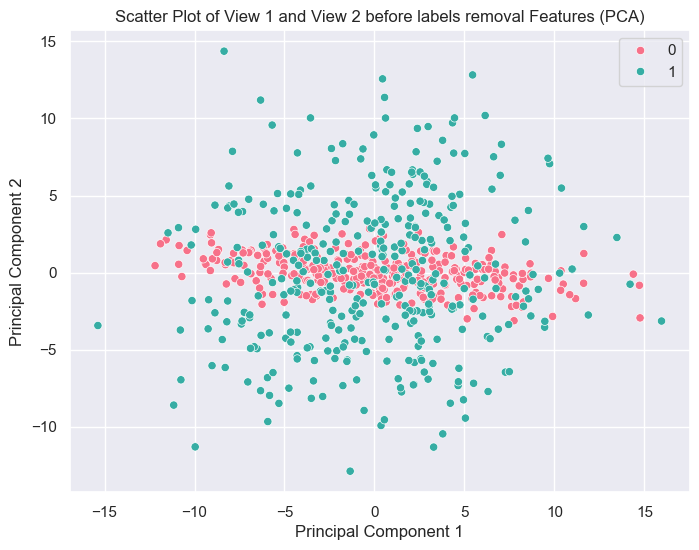

In [123]:
pca = PCA(n_components=2)  # Use PCA to reduce dimensionality to 2 components
pca_result = pca.fit_transform(np.hstack((train_dataset[0], train_dataset[1])))

scatter_plot_features(pca_result, train_dataset[2], "View 1 and View 2 before labels removal")

In [124]:
pca = PCA(n_components=2)  # Use PCA to reduce dimensionality to 2 components
pca_result_x1 = pca.fit_transform(X1)
pca_result_x2 = pca.fit_transform(X2)

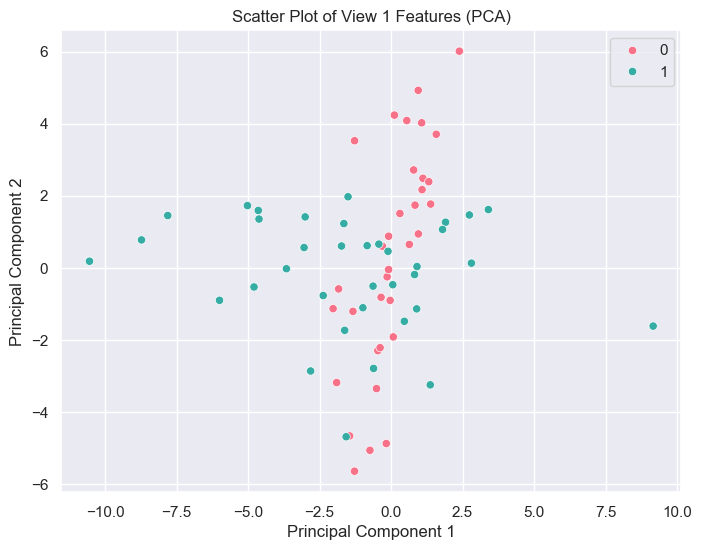

In [125]:
scatter_plot_features(pca_result_x1, y_train, "View 1")

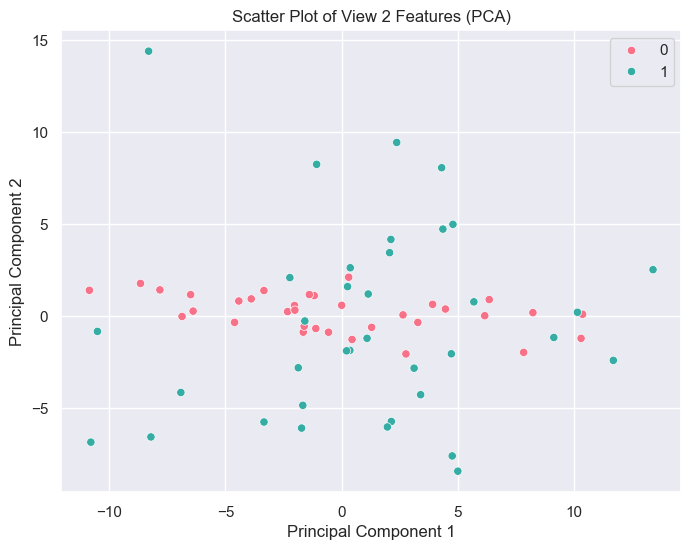

In [126]:
scatter_plot_features(pca_result_x2, y_train, "View 2")

In [127]:
print(y_train)

[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1
 -1  0 -1  1 -1  1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1  0  1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1  0 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
  1  0 -1  1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
  0  0  1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1

## CoTraining

In [128]:
lg_clf = CoTrainingClassifier(RandomForestClassifier(random_state=42), SVC(probability=True, random_state=42))
val_scores, y_after_train = lg_clf.fit(X1.copy(), X2.copy(), y_train.copy(), X1_val.copy(), X2_val.copy(), y_val.copy())
y_pred = lg_clf.predict(X1_test.copy(), X2_test.copy())

Iteration 1: 
Validation Accuracy: 0.8933333333333333
F1 Score: 0.8857142857142857
Precision: 0.9117647058823529
Recall: 0.8611111111111112


Iteration 2: 
Validation Accuracy: 0.8866666666666667
F1 Score: 0.8776978417266187
Precision: 0.9104477611940298
Recall: 0.8472222222222222


Iteration 3: 
Validation Accuracy: 0.9133333333333333
F1 Score: 0.9064748201438849
Precision: 0.9402985074626866
Recall: 0.875


Iteration 4: 
Validation Accuracy: 0.8933333333333333
F1 Score: 0.8805970149253731
Precision: 0.9516129032258065
Recall: 0.8194444444444444


Iteration 5: 
Validation Accuracy: 0.9
F1 Score: 0.8888888888888888
Precision: 0.9523809523809523
Recall: 0.8333333333333334


Iteration 6: 
Validation Accuracy: 0.9
F1 Score: 0.8888888888888888
Precision: 0.9523809523809523
Recall: 0.8333333333333334


Iteration 7: 
Validation Accuracy: 0.92
F1 Score: 0.9117647058823529
Precision: 0.96875
Recall: 0.8611111111111112


Iteration 8: 
Validation Accuracy: 0.9
F1 Score: 0.8872180451127819
Precis

In [129]:
# Count occurrences of unlabeled samples after train
count = np.count_nonzero(y_after_train == -1)

print("Number of unlabeled samples after training:", count)

Number of unlabeled samples after training: 69


In [130]:
y_after_train

array([ 1,  0,  1,  0,  0,  0,  0,  0,  1,  1,  0,  1, -1,  0,  1,  1,  0,
        0,  1,  0,  1,  0,  0,  0,  0,  1,  0,  0, -1,  1,  1,  0,  1,  1,
        1,  0,  0,  0,  0, -1,  0,  1,  1,  1,  1,  1,  1, -1,  0,  0,  0,
        1,  1,  1,  0,  1, -1,  1,  1,  0,  1,  0,  1, -1, -1,  1,  1,  1,
        1, -1,  0,  0, -1,  1,  1,  1,  0, -1,  1,  0,  1,  1, -1,  0,  1,
        1,  1,  1,  1,  1,  0,  0,  1,  1,  0, -1,  1,  0,  1,  1, -1,  1,
        0,  0,  0,  0,  0,  1,  1, -1,  0,  1, -1,  0,  1,  1,  1,  0,  0,
        1,  1,  1,  1,  1,  1,  0,  0,  0,  1,  0,  1,  1,  0,  0, -1,  1,
        1,  1,  1,  0,  1,  1,  0,  1, -1,  1,  0,  0,  1, -1,  1, -1,  0,
        0,  1,  1,  0,  1,  1,  1,  1,  1, -1,  0,  0,  0,  0,  0,  0, -1,
       -1,  1,  1,  0,  0,  0,  0,  0,  1, -1,  0,  0,  1,  0,  1,  1,  1,
        0,  0,  1,  0,  0,  1,  1,  0,  0,  0, -1,  0,  0, -1,  0,  1,  1,
        1,  0,  1, -1,  0,  1,  0,  1,  1,  0,  0,  0,  1,  0,  0,  1,  0,
        0,  1,  1,  0,  1

In [131]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.97      0.93        79
           1       0.97      0.87      0.92        71

    accuracy                           0.93       150
   macro avg       0.93      0.92      0.93       150
weighted avg       0.93      0.93      0.93       150



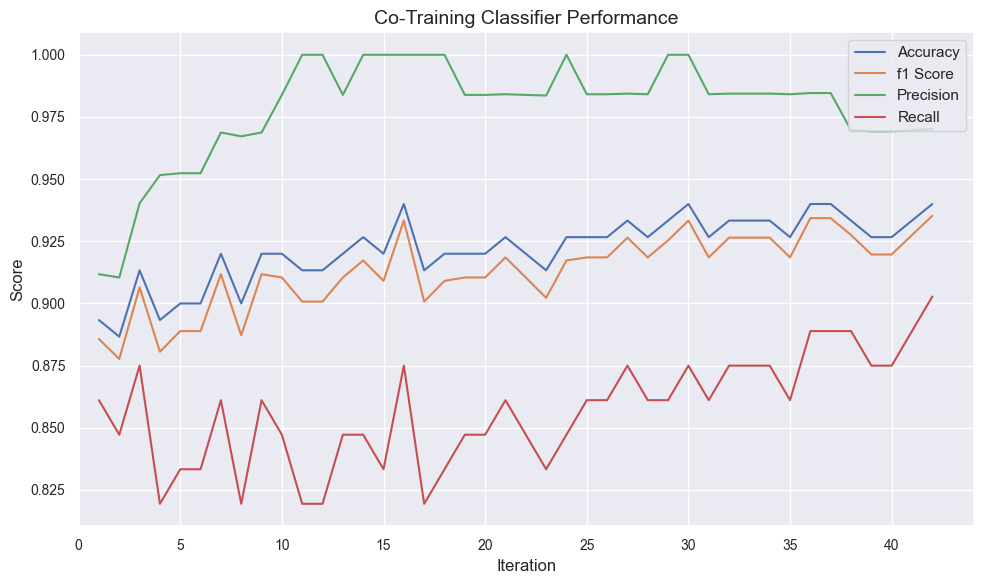

In [132]:
plot_co_training_performance(val_scores, len(val_scores))

## Compare to dataset with all labels

In [133]:
clf1 = RandomForestClassifier(random_state=42)
clf2 = SVC(probability=True, random_state=42)

metrics_dict = compare_models(train_dataset_labels_removed, train_dataset, val_dataset, test_dataset, clf1, clf2)

Iteration 1: 
Validation Accuracy: 0.8933333333333333
F1 Score: 0.8857142857142857
Precision: 0.9117647058823529
Recall: 0.8611111111111112


Iteration 2: 
Validation Accuracy: 0.8866666666666667
F1 Score: 0.8776978417266187
Precision: 0.9104477611940298
Recall: 0.8472222222222222


Iteration 3: 
Validation Accuracy: 0.9133333333333333
F1 Score: 0.9064748201438849
Precision: 0.9402985074626866
Recall: 0.875


Iteration 4: 
Validation Accuracy: 0.8933333333333333
F1 Score: 0.8805970149253731
Precision: 0.9516129032258065
Recall: 0.8194444444444444


Iteration 5: 
Validation Accuracy: 0.9
F1 Score: 0.8888888888888888
Precision: 0.9523809523809523
Recall: 0.8333333333333334


Iteration 6: 
Validation Accuracy: 0.9
F1 Score: 0.8888888888888888
Precision: 0.9523809523809523
Recall: 0.8333333333333334


Iteration 7: 
Validation Accuracy: 0.92
F1 Score: 0.9117647058823529
Precision: 0.96875
Recall: 0.8611111111111112


Iteration 8: 
Validation Accuracy: 0.9
F1 Score: 0.8872180451127819
Precis

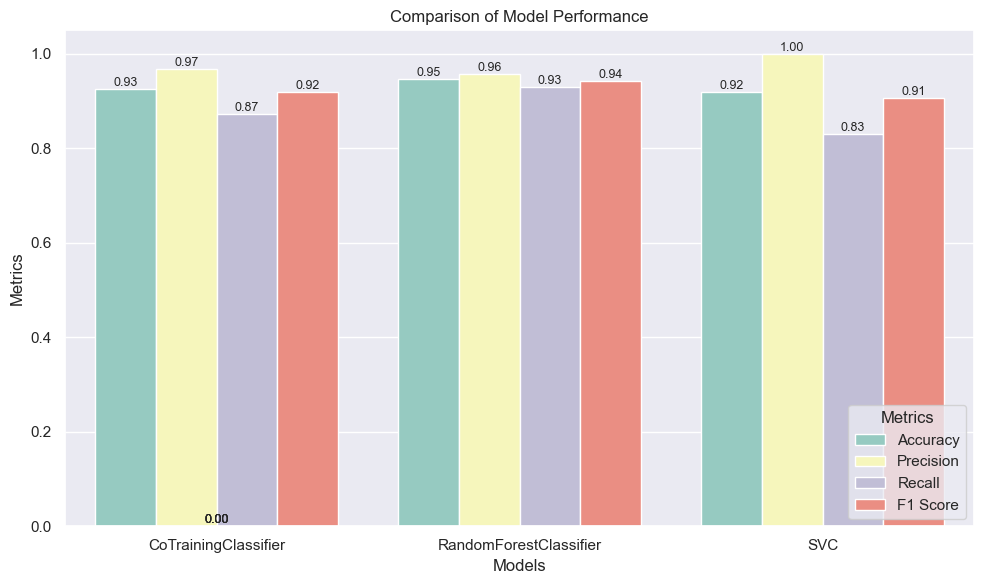

In [134]:
plot_model_comparison(models=metrics_dict.keys(), metrics_dict=metrics_dict)

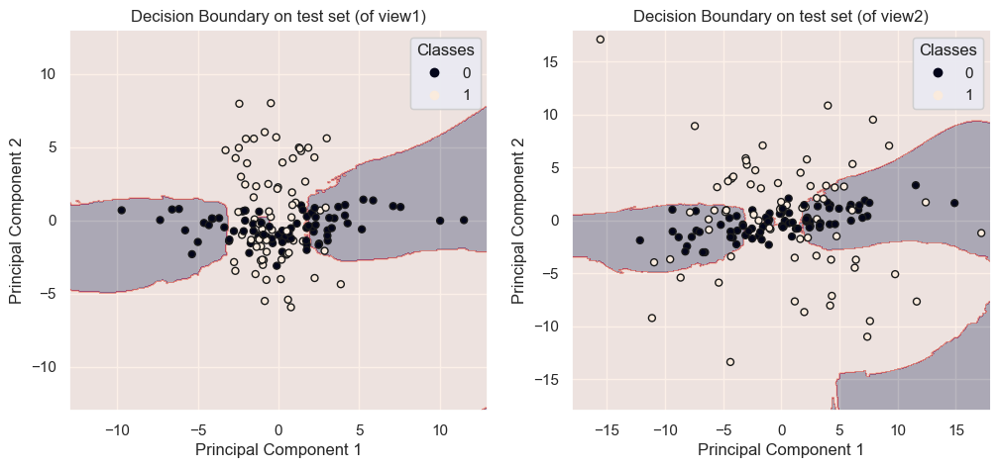

In [135]:
# Create subplots for each view
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot decision boundary for View 1
plot_decision_boundaries_with_dr(ax1, X1_test, X2_test, y_test, lg_clf, title='Decision Boundary on test set (of view1)', resolution=0.08)

# Swap models to present view 2
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp

# Plot decision boundary for View 2
plot_decision_boundaries_with_dr(ax2, X2_test, X1_test, y_test, lg_clf, title='Decision Boundary on test set (of view2)', resolution=0.08)
plt.show()

# Revert swap
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp

### NB Classifier Decision Bounderies

We also tried different classifiers to see if the results are better than with the RF and SVC we choose earlier.

In [138]:
lg_clf = CoTrainingClassifier(GaussianNB(), GaussianNB())
_, y_after_train = lg_clf.fit(X1.copy(), X2.copy(), y_train.copy(), X1_val.copy(), X2_val.copy(), y_val.copy())

Iteration 1: 
Validation Accuracy: 0.9466666666666667
F1 Score: 0.9420289855072463
Precision: 0.9848484848484849
Recall: 0.9027777777777778


Iteration 2: 
Validation Accuracy: 0.94
F1 Score: 0.9361702127659575
Precision: 0.9565217391304348
Recall: 0.9166666666666666


Iteration 3: 
Validation Accuracy: 0.9266666666666666
F1 Score: 0.9219858156028369
Precision: 0.9420289855072463
Recall: 0.9027777777777778


Iteration 4: 
Validation Accuracy: 0.9266666666666666
F1 Score: 0.9219858156028369
Precision: 0.9420289855072463
Recall: 0.9027777777777778


Iteration 5: 
Validation Accuracy: 0.94
F1 Score: 0.935251798561151
Precision: 0.9701492537313433
Recall: 0.9027777777777778


Iteration 6: 
Validation Accuracy: 0.94
F1 Score: 0.935251798561151
Precision: 0.9701492537313433
Recall: 0.9027777777777778


Iteration 7: 
Validation Accuracy: 0.94
F1 Score: 0.9361702127659575
Precision: 0.9565217391304348
Recall: 0.9166666666666666


Iteration 8: 
Validation Accuracy: 0.9466666666666667
F1 Score: 

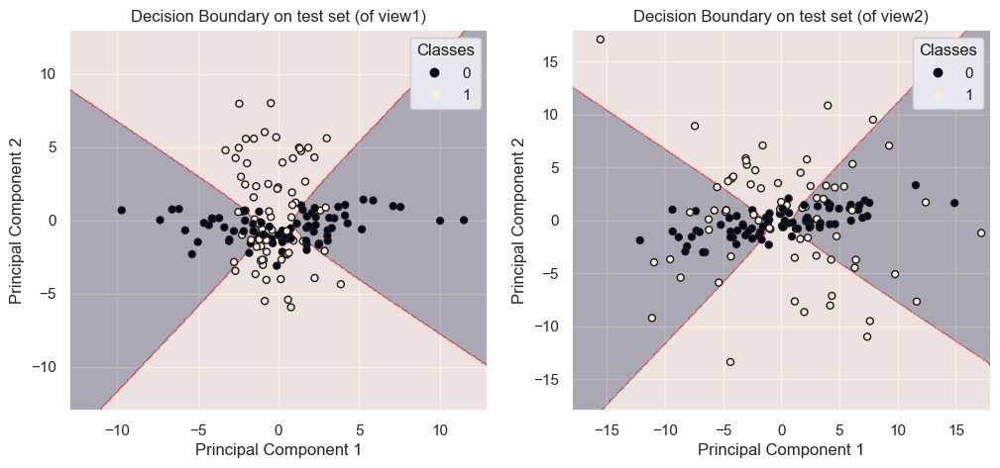

In [139]:
# Create subplots for each view
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot decision boundary for View 1
plot_decision_boundaries_with_dr(ax1, X1_test, X2_test, y_test, lg_clf, title='Decision Boundary on test set (of view1)', resolution=0.08)

# Swap models to present view 2
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp

# Plot decision boundary for View 2
plot_decision_boundaries_with_dr(ax2, X2_test, X1_test, y_test, lg_clf, title='Decision Boundary on test set (of view2)', resolution=0.08)
plt.show()

# Revert swap
temp = lg_clf.model1_
lg_clf.model1_ = lg_clf.model2_
lg_clf.model2_ = temp